In [8]:
from pathlib import Path
import json
import re
import matplotlib.pyplot as plt

BASE_ROOT = Path(r"C:\Users\natal\Desktop\STUDIA MGR\SEM1\ZZSN\DoesDiffusionLearn3D\data\experiments")


def _extract_radius_from_name(name):
    m = re.search(r'_r(?P<r>[0-9]+(?:\.[0-9]+)?)', name)
    return float(m.group('r')) if m else None


def _extract_energy_from_name(name):
    m = re.search(r'_e(?P<e>[0-9]+(?:\.[0-9]+)?)', name)
    return float(m.group('e')) if m else None


def display_samples(version='v35', shape='SmoothCube_v2', n=9, base_root=BASE_ROOT):
    base_dir = base_root / version
    image_dir = base_dir / 'images' / shape
    scene_dir = base_dir / 'scenes' / shape

    if not scene_dir.exists():
        raise FileNotFoundError(f"Scene directory not found: {scene_dir}")

    # Exclude combined file CLEVR_scenes.json
    all_json = [p for p in scene_dir.glob('*.json') if p.name != 'CLEVR_scenes.json']

    # Collect metadata per file.
    records = []
    for p in all_json:
        energy = None
        radius = _extract_radius_from_name(p.stem)
        try:
            with p.open('r', encoding='utf-8') as f:
                data = json.load(f)
            if 'light_energy' in data and data['light_energy'] is not None:
                energy = float(data['light_energy'])
            else:
                energy = _extract_energy_from_name(p.stem)
            if radius is None and data.get('light_radius') is not None:
                radius = float(data['light_radius'])
        except Exception:
            energy = _extract_energy_from_name(p.stem)

        records.append((p, energy, radius))

    # Sort by lamp energy when available; fallback to filename.
    records.sort(key=lambda rec: (rec[1] is None, rec[1] if rec[1] is not None else rec[0].name))
    selected = records[:n]

    if len(selected) == 0:
        print(f'No JSON scene files found in {scene_dir}')
        return

    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.ravel()

    radii = []
    energies = []

    for ax, (json_path, energy, radius) in zip(axes, selected):
        with json_path.open('r', encoding='utf-8') as f:
            data = json.load(f)

        image_name = data.get('image_filename', json_path.with_suffix('.png').name)
        image_path = image_dir / image_name
        if not image_path.exists():
            fallback_path = image_dir / f"{json_path.stem}.png"
            if fallback_path.exists():
                image_path = fallback_path

        image = plt.imread(image_path)
        obj = data.get('objects', [{}])[0]

        if energy is None and data.get('light_energy') is not None:
            energy = float(data['light_energy'])
        if radius is None and data.get('light_radius') is not None:
            radius = float(data['light_radius'])

        e_val = f"{energy:g}" if energy is not None else 'N/A'
        r_val = f"{radius:g}" if radius is not None else 'N/A'
        energies.append(e_val)
        radii.append(r_val)

        title = (
            f"{image_name}\n"
            f"light_elevation_deg: {data.get('light_elevation_deg', 'N/A')}\n"
            f"light_azimuth_deg: {data.get('light_azimuth_deg', 'N/A')}\n"
            f"rotation: {obj.get('rotation', 'N/A')}\n"
            f"light_radius: {r_val}\n"
            f"light_energy: {e_val}"
        )

        ax.imshow(image)
        ax.set_title(title, fontsize=15)
        ax.axis('off')

    # Turn off any unused axes
    for ax in axes[len(selected):]:
        ax.axis('off')

    numeric_radii = sorted({float(r) for r in radii if r != 'N/A'})
    numeric_energies = sorted({float(e) for e in energies if e != 'N/A'})

    radii_text = ', '.join(f"{r:g}" for r in numeric_radii) if numeric_radii else 'N/A'
    energies_text = ', '.join(f"{e:g}" for e in numeric_energies) if numeric_energies else 'N/A'

    plt.suptitle(
        f"Version {version} - radii: {radii_text} - energies: {energies_text}",
        fontsize=18,
    )
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [9]:
from pathlib import Path
import json
import re
import matplotlib.pyplot as plt

BASE_ROOT = Path(r"C:\Users\natal\Desktop\STUDIA MGR\SEM1\ZZSN\DoesDiffusionLearn3D\data\experiments")


def _extract_radius_from_name(name):
    m = re.search(r'_r(?P<r>[0-9]+(?:\.[0-9]+)?)', name)
    return float(m.group('r')) if m else None


def _extract_azimuth_from_name(name):
    m = re.search(r'_a(?P<a>[0-9]+(?:\.[0-9]+)?)', name)
    return float(m.group('a')) if m else None


def display_samples(version='v35', shape='SmoothCube_v2', n=9, base_root=BASE_ROOT):
    base_dir = base_root / version
    image_dir = base_dir / 'images' / shape
    scene_dir = base_dir / 'scenes' / shape

    if not scene_dir.exists():
        raise FileNotFoundError(f"Scene directory not found: {scene_dir}")

    # Exclude combined file CLEVR_scenes.json
    all_json = [p for p in scene_dir.glob('*.json') if p.name != 'CLEVR_scenes.json']

    records = []
    for p in all_json:
        azimuth = _extract_azimuth_from_name(p.stem)
        radius = _extract_radius_from_name(p.stem)

        try:
            with p.open('r', encoding='utf-8') as f:
                data = json.load(f)
            if azimuth is None and data.get('light_azimuth_deg') is not None:
                azimuth = float(data['light_azimuth_deg'])
            if radius is None and data.get('light_radius') is not None:
                radius = float(data['light_radius'])
        except Exception:
            pass

        records.append((p, azimuth, radius))

    # Sort ascending by azimuth when available; files without azimuth go last.
    records.sort(key=lambda rec: (rec[1] is None, rec[1] if rec[1] is not None else rec[0].name))
    selected = records[:n]

    if len(selected) == 0:
        print(f'No JSON scene files found in {scene_dir}')
        return

    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.ravel()

    azimuths = []
    radii = []

    for ax, (json_path, azimuth, radius) in zip(axes, selected):
        with json_path.open('r', encoding='utf-8') as f:
            data = json.load(f)

        image_name = data.get('image_filename', json_path.with_suffix('.png').name)
        image_path = image_dir / image_name
        if not image_path.exists():
            fallback_path = image_dir / f"{json_path.stem}.png"
            if fallback_path.exists():
                image_path = fallback_path

        image = plt.imread(image_path)

        if azimuth is None and data.get('light_azimuth_deg') is not None:
            azimuth = float(data['light_azimuth_deg'])
        if radius is None and data.get('light_radius') is not None:
            radius = float(data['light_radius'])

        a_val = f"{azimuth:g}" if azimuth is not None else 'N/A'
        r_val = f"{radius:g}" if radius is not None else 'N/A'
        azimuths.append(a_val)
        radii.append(r_val)

        title = (
            f"{image_name}\n"
            f"light_azimuth_deg: {a_val}\n"
            f"light_elevation_deg: {data.get('light_elevation_deg', 'N/A')}\n"
            f"light_radius: {r_val}"
        )

        ax.imshow(image)
        ax.set_title(title, fontsize=15)
        ax.axis('off')

    # Turn off any unused axes
    for ax in axes[len(selected):]:
        ax.axis('off')

    numeric_azimuths = sorted({float(a) for a in azimuths if a != 'N/A'})
    numeric_radii = sorted({float(r) for r in radii if r != 'N/A'})

    azimuths_text = ', '.join(f"{a:g}" for a in numeric_azimuths) if numeric_azimuths else 'N/A'
    radii_text = ', '.join(f"{r:g}" for r in numeric_radii) if numeric_radii else 'N/A'

    plt.suptitle(
        f"Version {version} - azimuths: {azimuths_text} - radii: {radii_text}",
        fontsize=18,
    )
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [17]:
def display_samples(version='v43', shape='SmoothCube_v2', n=9, base_root=BASE_ROOT):
    base_dir = base_root / version
    image_dir = base_dir / 'images' / shape
    scene_dir = base_dir / 'scenes' / shape

    if not scene_dir.exists():
        raise FileNotFoundError(f"Scene directory not found: {scene_dir}")

    all_json = [p for p in scene_dir.glob('*.json') if p.name != 'CLEVR_scenes.json']

    records = []
    for p in all_json:
        azimuth = _extract_azimuth_from_name(p.stem)
        radius = _extract_radius_from_name(p.stem)
        try:
            with p.open('r', encoding='utf-8') as f:
                data = json.load(f)
            if azimuth is None and data.get('light_azimuth_deg') is not None:
                azimuth = float(data['light_azimuth_deg'])
            if radius is None and data.get('light_radius') is not None:
                radius = float(data['light_radius'])
        except Exception:
            data = {}
        records.append((p, azimuth, radius, data))

    # Sort ascending by azimuth when available; files without azimuth go last.
    records.sort(key=lambda rec: (rec[1] is None, rec[1] if rec[1] is not None else rec[0].name))
    selected = records[:n]

    if len(selected) == 0:
        print(f'No JSON scene files found in {scene_dir}')
        return

    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.ravel()

    azimuths = []
    radii = []
    centers = []

    for ax, (json_path, azimuth, radius, data) in zip(axes, selected):
        # ensure data loaded
        if not data:
            with json_path.open('r', encoding='utf-8') as f:
                data = json.load(f)

        image_name = data.get('image_filename', json_path.with_suffix('.png').name)
        image_path = image_dir / image_name
        if not image_path.exists():
            fallback_path = image_dir / f"{json_path.stem}.png"
            if fallback_path.exists():
                image_path = fallback_path

        image = plt.imread(image_path)

        if azimuth is None and data.get('light_azimuth_deg') is not None:
            azimuth = float(data['light_azimuth_deg'])
        if radius is None and data.get('light_radius') is not None:
            radius = float(data['light_radius'])

        # extract object center on horizontal plane
        obj = data.get('objects', [{}])[0] if isinstance(data.get('objects'), list) else {}
        center = None

        # 1) preferred: '3d_coords' (x,y,z)
        v = obj.get('3d_coords') or obj.get('3d_coord') or obj.get('coords') or obj.get('3d_coords_world')
        if isinstance(v, (list, tuple)) and len(v) >= 2:
            try:
                center = (float(v[0]), float(v[1]))
            except Exception:
                center = None

        # 2) fallback: explicit dict with x/y
        if center is None and isinstance(obj, dict):
            if 'position' in obj:
                v = obj['position']
                if isinstance(v, dict) and 'x' in v and 'y' in v:
                    try:
                        center = (float(v['x']), float(v['y']))
                    except Exception:
                        center = None
                elif isinstance(v, (list, tuple)) and len(v) >= 2:
                    try:
                        center = (float(v[0]), float(v[1]))
                    except Exception:
                        center = None
            elif 'center' in obj:
                v = obj['center']
                if isinstance(v, dict) and 'x' in v and 'y' in v:
                    try:
                        center = (float(v['x']), float(v['y']))
                    except Exception:
                        center = None
                elif isinstance(v, (list, tuple)) and len(v) >= 2:
                    try:
                        center = (float(v[0]), float(v[1]))
                    except Exception:
                        center = None
            elif 'pixel_coords' in obj and isinstance(obj['pixel_coords'], (list, tuple)) and len(obj['pixel_coords']) >= 3:
                # last-resort: pixel coords present (not world coords) — include as fallback info
                # store pixel x,y as center (but note: these are image pixels, not world coords)
                try:
                    center = (float(obj['pixel_coords'][0]), float(obj['pixel_coords'][1]))
                except Exception:
                    center = None

        center_str = f"({center[0]:.4f}, {center[1]:.4f})" if center is not None else 'N/A'
        if center is not None:
            centers.append(center)

        a_val = f"{azimuth:g}" if azimuth is not None else 'N/A'
        r_val = f"{radius:g}" if radius is not None else 'N/A'
        azimuths.append(a_val)
        radii.append(r_val)

        title = (
            f"{image_name}\n"
            f"object_center_xy: {center_str}\n"
            f"light_azimuth_deg: {a_val}\n"
            f"light_elevation_deg: {data.get('light_elevation_deg', 'N/A')}\n"
            f"light_radius: {r_val}"
        )

        ax.imshow(image)
        ax.set_title(title, fontsize=12)
        ax.axis('off')

    # Turn off any unused axes
    for ax in axes[len(selected):]:
        ax.axis('off')

    # compute center ranges if any centers found
    if centers:
        xs = [c[0] for c in centers]
        ys = [c[1] for c in centers]
        x_min, x_max = min(xs), max(xs)
        y_min, y_max = min(ys), max(ys)
        center_summary = f"x_range: [{x_min:.4f}, {x_max:.4f}], y_range: [{y_min:.4f}, {y_max:.4f}]"
    else:
        center_summary = "centers: N/A"

    numeric_azimuths = sorted({float(a) for a in azimuths if a != 'N/A'})
    numeric_radii = sorted({float(r) for r in radii if r != 'N/A'})

    azimuths_text = ', '.join(f"{a:g}" for a in numeric_azimuths) if numeric_azimuths else 'N/A'
    radii_text = ', '.join(f"{r:g}" for r in numeric_radii) if numeric_radii else 'N/A'

    plt.suptitle(
        f"Version {version} - azimuths: {azimuths_text} - radii: {radii_text} - {center_summary}",
        fontsize=14,
    )
    plt.tight_layout(rect=[0, 0, 1, 0.94])
    plt.show()

# v35 - azimuth 0

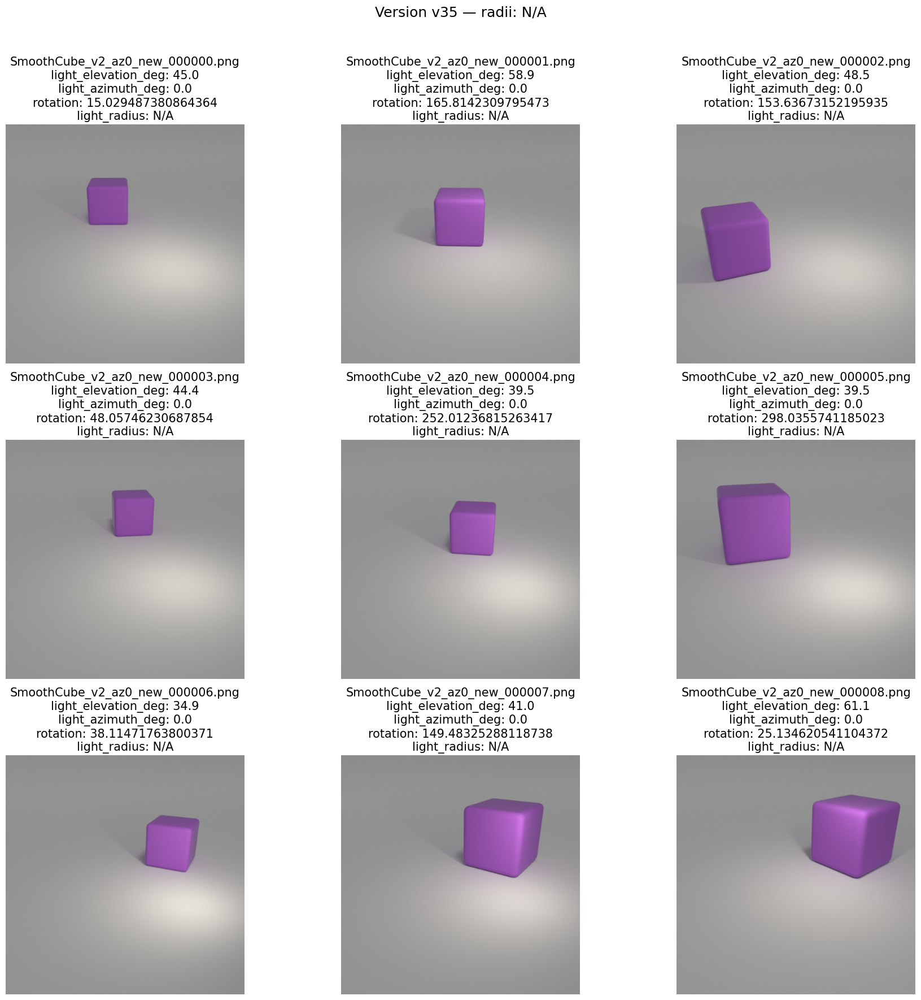

In [10]:
display_samples('v35')

# v36 - azimuth 90

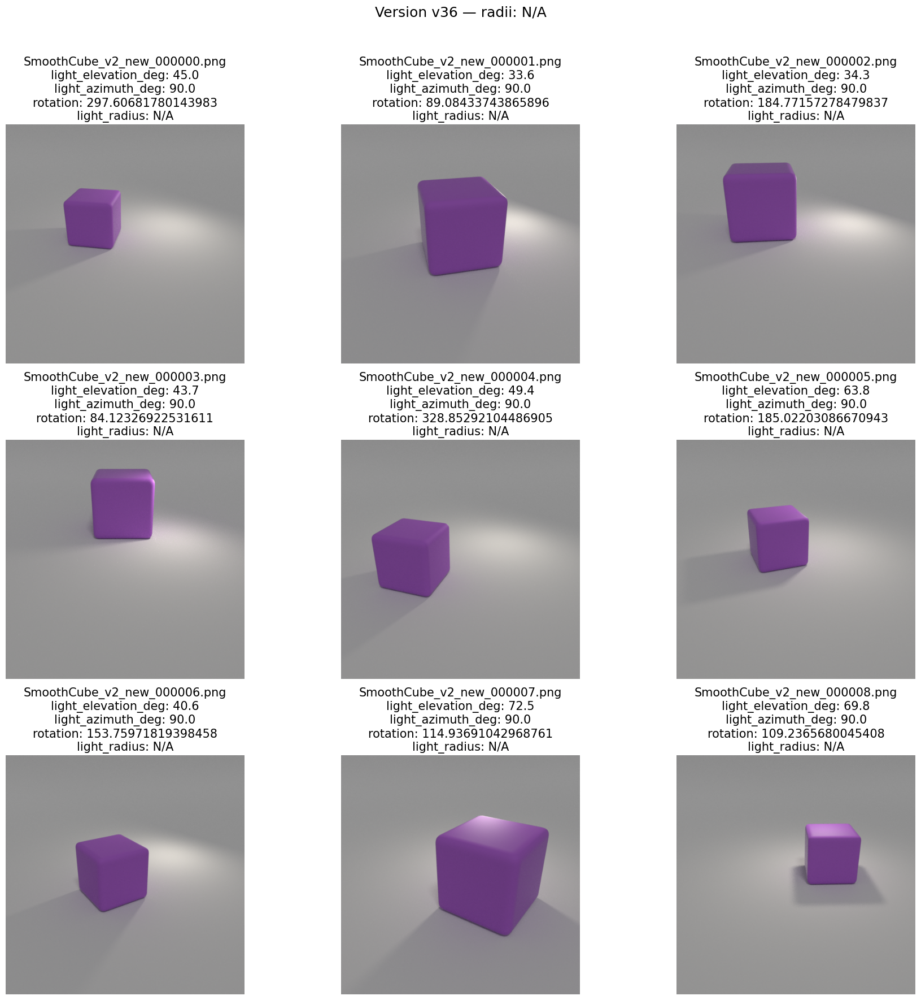

In [9]:
display_samples('v36')

# v37 - azimuth 180

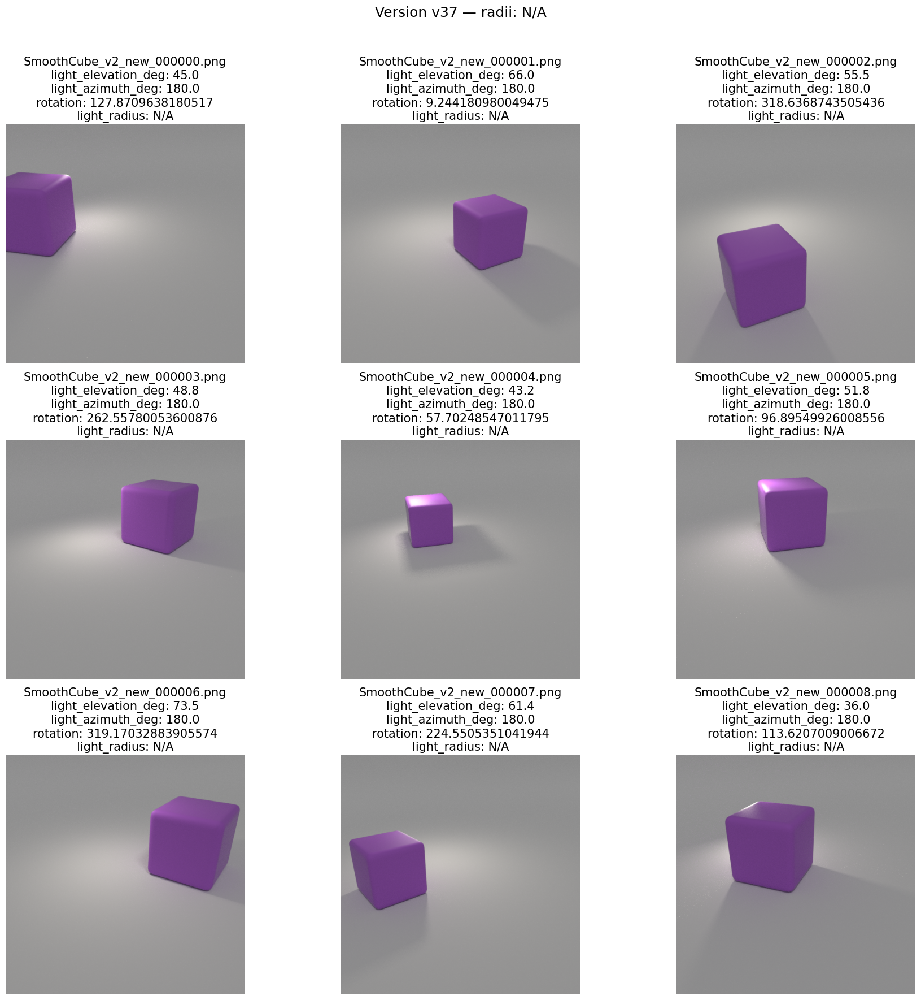

In [12]:
display_samples('v37')

# v38

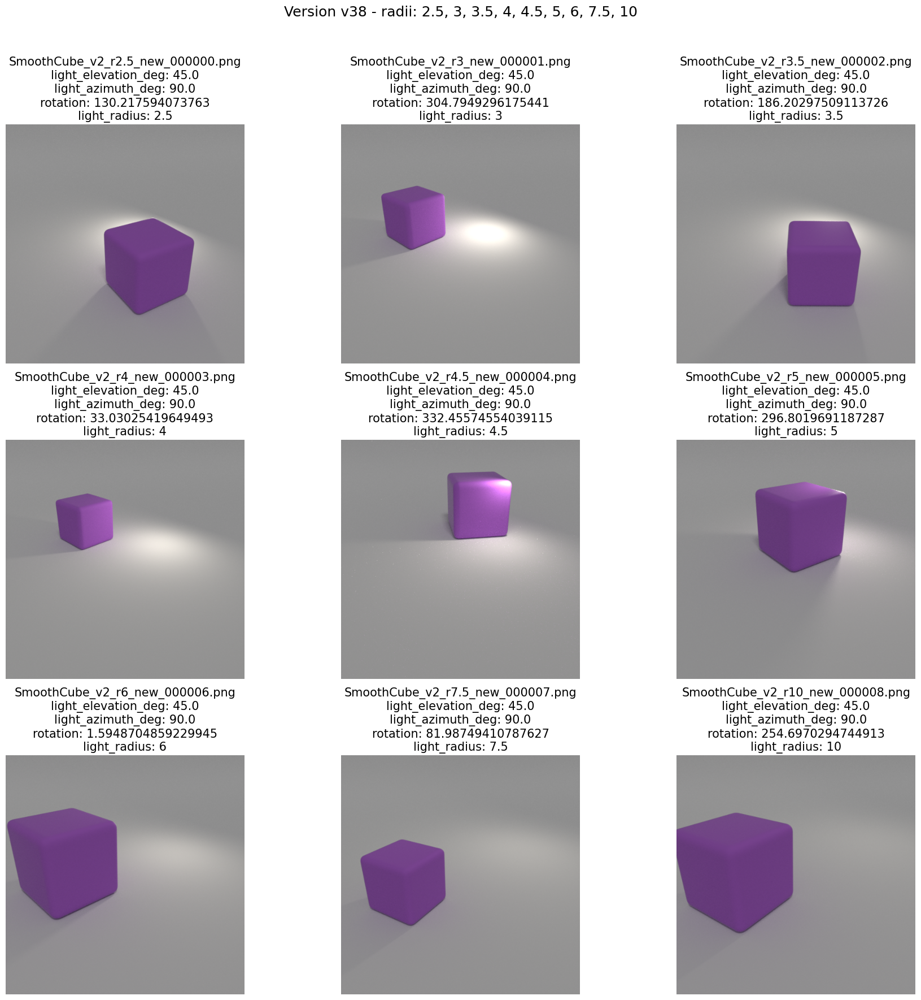

In [15]:
display_samples('v38')

# v39

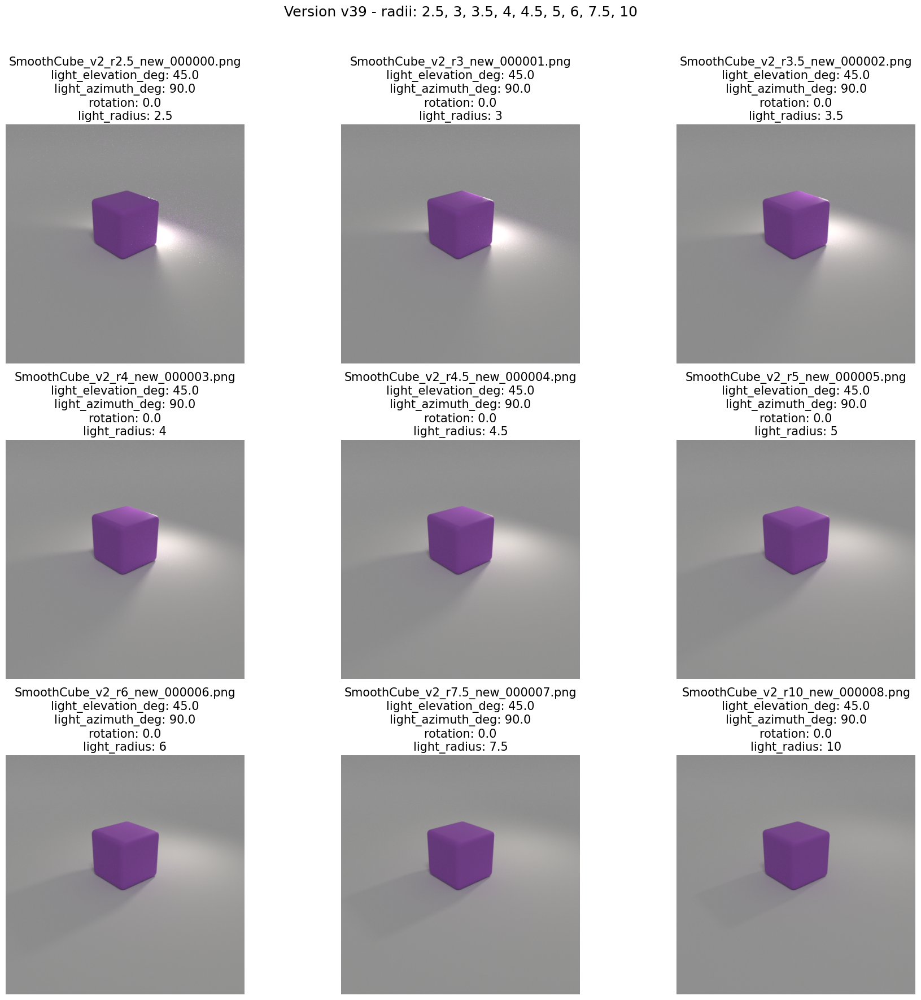

In [16]:
display_samples('v39')

# v40

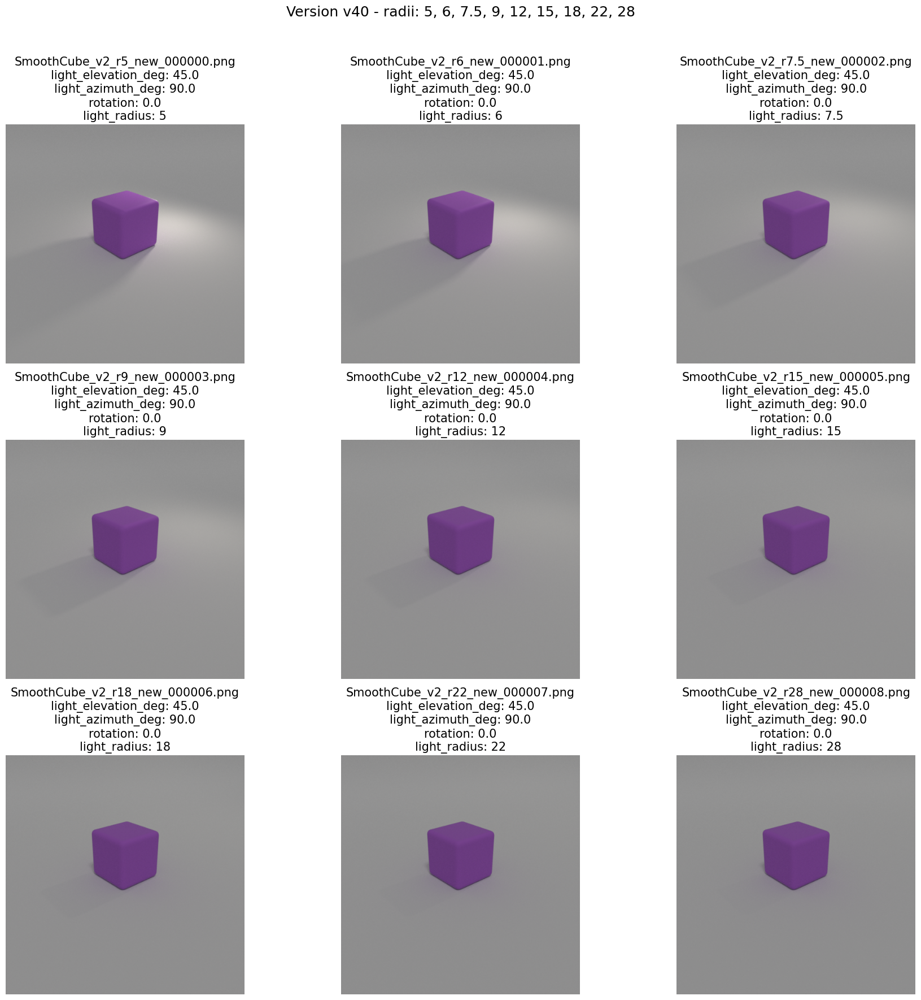

In [17]:
display_samples('v40')

# v41

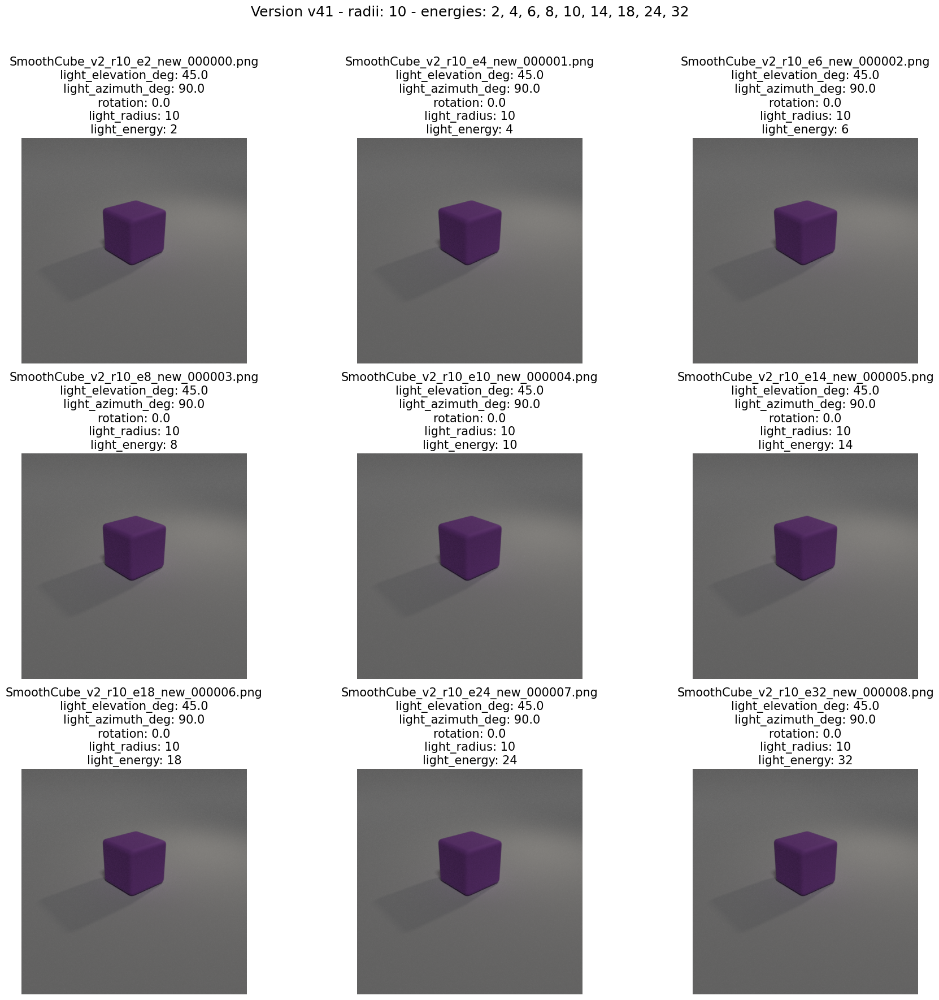

In [5]:
display_samples('v41')

# v42

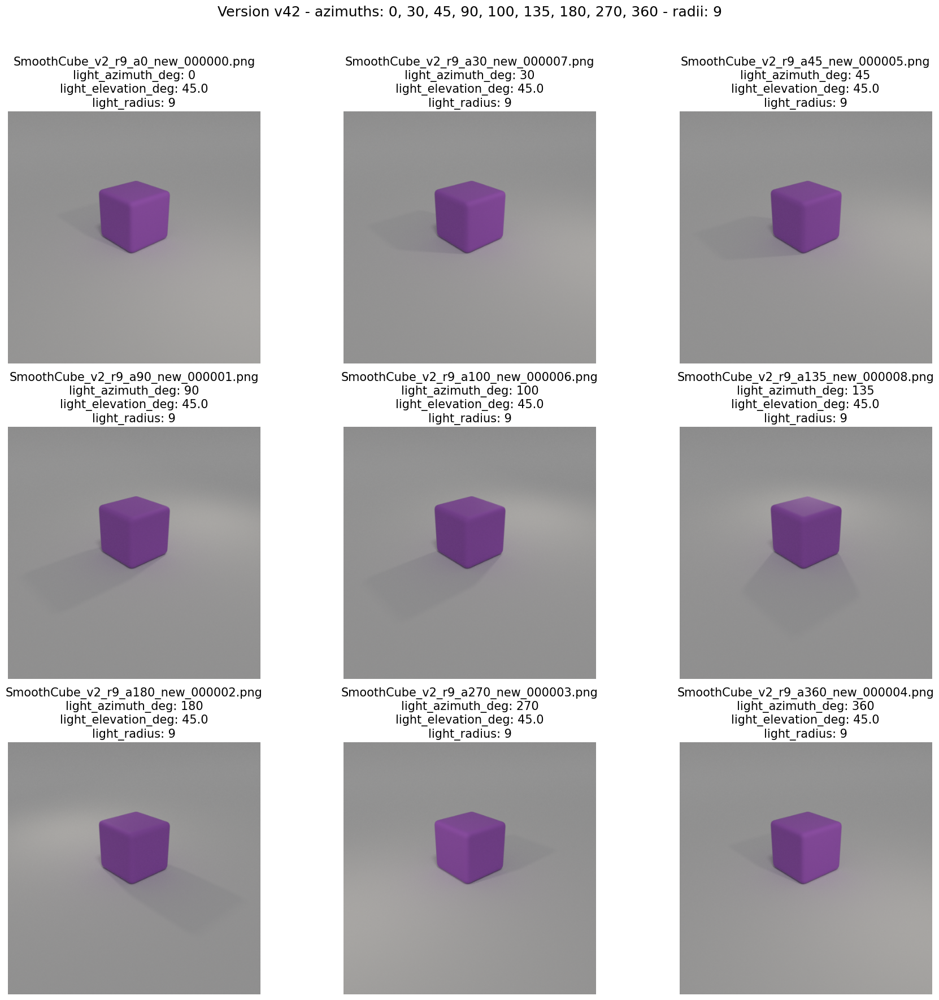

In [10]:
display_samples('v42')

# v43

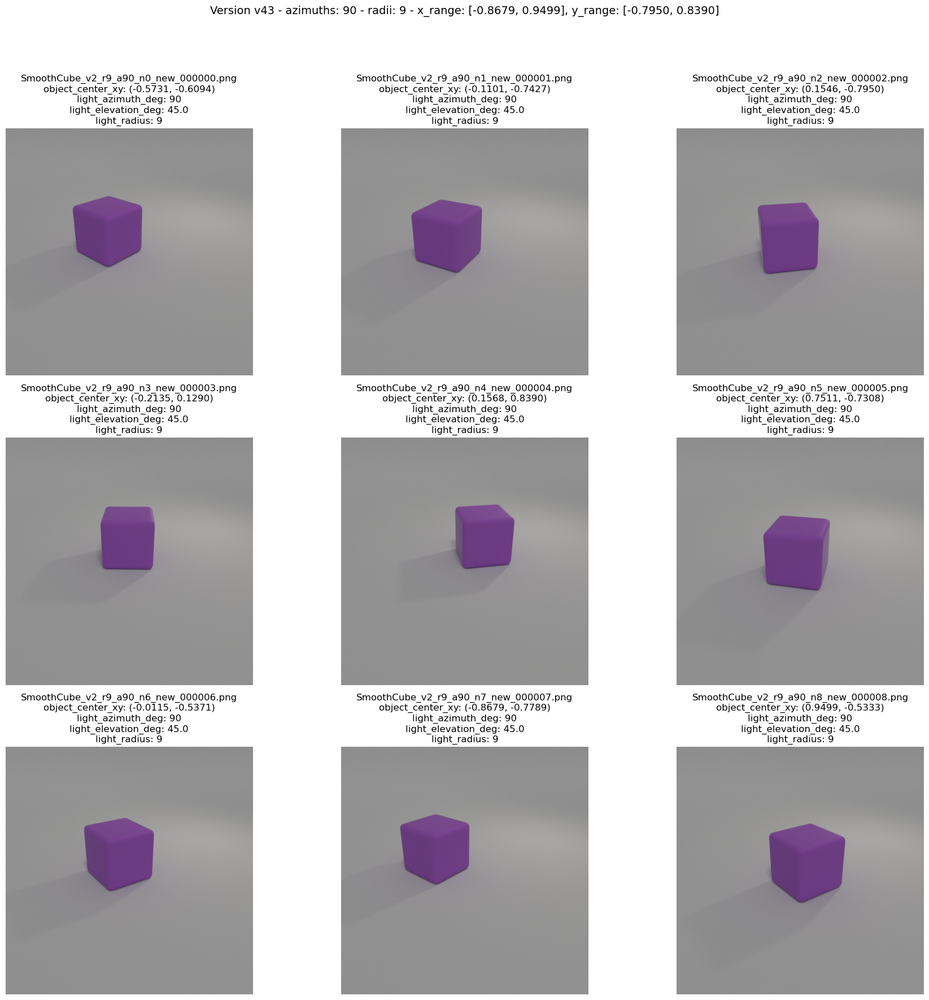

In [18]:
display_samples('v43')